In [6]:
import sys
import os




project_path = r"C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder"
if project_path not in sys.path:
    sys.path.append(project_path)

import track_builder as tb

import pandas as pd
import track_builder as tb

import os

BASE_PATH = r"C:\Users\lamin\Documents\maitrise\ASTD\data"
YEAR      = 2019

PERIODS = {
    2019: [10, 11, 12],  # Oct, Nov, Dec
    2020: [1, 2, 3]      # Jan, Feb, Mar
}

USECOLS   = "default"
SAMPLING  = [0, -1]

COLS_REQUIRED = [
    "shipid",
    "date_time_utc",
    "latitude",
    "longitude",
    "astd_cat",
    "flagname",
    "iceclass",
    "sizegroup_gt"
]


In [2]:

df_for_track = tb.load_astd_periods(
    BASE_PATH, periods=PERIODS, progress=True,
    usecols=USECOLS, sampling=SAMPLING, remove_nan_rows=COLS_REQUIRED
)
 

c:\Users\lamin\miniconda3\envs\astd-track\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading data for year 2019, months: [10, 11, 12]...


Loading ASTD CSVs:   0%|          | 0/3 [00:00<?, ?it/s]

Loading ASTD CSVs: 100%|██████████| 3/3 [03:33<00:00, 71.25s/it]


Loading data for year 2020, months: [1, 2, 3]...


Loading ASTD CSVs: 100%|██████████| 3/3 [03:17<00:00, 65.86s/it]


Merging datasets...


In [3]:

df = tb.load_astd_periods(
    BASE_PATH, periods=PERIODS, progress=True,
    usecols=USECOLS, sampling=None, remove_nan_rows=COLS_REQUIRED
)
    
 

Loading data for year 2019, months: [10, 11, 12]...


Loading ASTD CSVs: 100%|██████████| 3/3 [03:03<00:00, 61.14s/it]


Loading data for year 2020, months: [1, 2, 3]...


Loading ASTD CSVs: 100%|██████████| 3/3 [03:15<00:00, 65.32s/it]


Merging datasets...


In [ ]:

tracks = tb.build_ship_tracks(df_for_track,
                                max_time_gap_hours=25,
                                max_distance_km=400,
                                min_track_length=1,
                                matching_strategy="balanced",
                                return_logs=False,
                                )

tracks

,month,segment_id,track_id
0,2019-10,4420,1
1,2019-11,4443,1
2,2019-12,3945,1
3,2020-01,3841,1
4,2020-02,4024,1
...,...,...,...
6333,2020-03,16516,3146
6334,2020-03,10461,3147
6335,2020-03,4472,3148
6336,2020-03,16496,3149


In [ ]:

work = tb.build_light_multi_track_data(track_table=tracks, track_sampling=30, positions_df=df, n_tracks_length=6, preprocess_positions=True)

fig = tb.plot_ship_tracks(
    work,
    color_by="track_id",
    color_mode="categorical",
    show_points=False,
    map_style="open-street-map",
    title="Tracks (light multi-track sample)",
)
fig.update_layout(showlegend=False)
fig.show()

computing typical speeds...


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:382: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  out = (ship_means.groupby('astd_cat')
C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:170: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  valid_bwd = valid_fwd.shift(1).fillna(False) & is_same_ship_prev


Cleaning completed: 12261 'ghost' or aberrant points removed.


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\io\astd_loader.py:548: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.iloc[::point_stride])


Nettoyage Antiméridien : 2 tracks retirés pour affichage propre.


In [11]:
track_457 = tb.load_track_data(track_ids=[457], track_table=tracks, base_path=BASE_PATH, chunksize=500_000)

Batch loading 1 tracks: 100%|██████████| 6/6 [03:39<00:00, 36.56s/it]


computing typical speeds...
Cleaning completed: 2 'ghost' or aberrant points removed.


C:\Users\lamin\Documents\maitrise\ASTD\TrackBuilder\track_builder\core\track_helpers.py:170: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [12]:
fig_track_457 = tb.plot_individual_track(
        track_id=457,
        track_table=tracks,
        astd_data=track_457,
        show_segments=True,
        map_style="open-street-map",
        title=f"Track {457}",
    )
    
fig_track_457.show()

In [16]:

gdf_tracks = tb.points_to_lines(track_457, group_by='track_id')


gdf_tracks

,track_id,flagname,iceclass,astd_cat,sizegroup_gt,start,end,geometry
0,457,Faeroe Islands,FS Ice Class 1C,Fishing vessels,1000 - 4999 GT,2019-10-01 00:08:28+00:00,2020-03-31 23:57:46+00:00,"LINESTRING (-59.83455 69.55896, -59.81759 69.5..."


<Axes: >

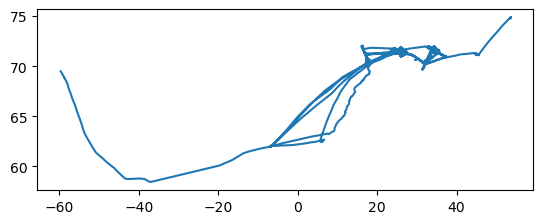

In [17]:
gdf_tracks.plot()

<Axes: >

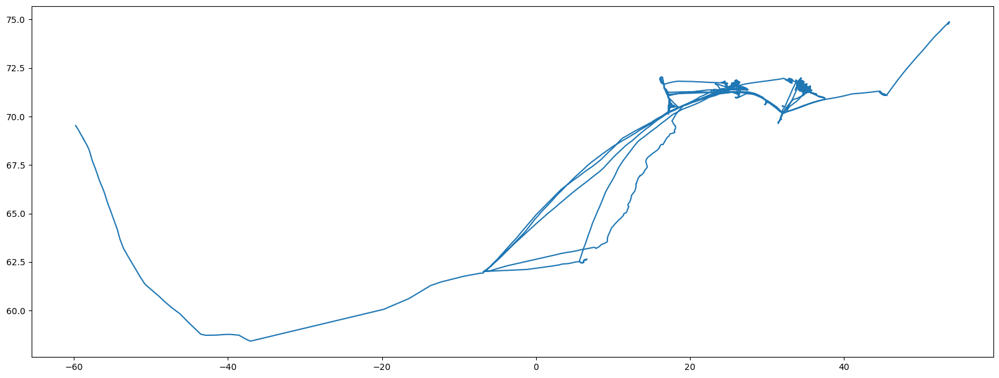

In [19]:
gdf_tracks.plot(column='track_id', cmap='tab20', figsize=(20, 20))